In [60]:
import tensorflow as tf
import os
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
from IPython.display import clear_output
import numpy as np
from PIL import Image,ImageDraw,ImageFont
import sys
import time
import cv2
import random
begin_time=time.time()

In [61]:
# Image classification pretrained vgg16 model
weights=np.load("C:\\Users\\georg\\OneDrive\\pascal\\vgg16.npy",allow_pickle=True,encoding="latin1").item()

In [62]:
%notebook "C:\Users\georg\OneDrive\pascal\yoloyolo-Copy1.ipynb"     

In [63]:
B=5  # Bounding box per grid
S=14 # Gird cell  number
num_class=20
img_width=448
img_height=448

In [86]:
def get_iou(b1,b2,standarded=False):  # box denoted by 4 points [ul,ur,dr,dl]
    w=min(b1[1][0],b2[1][0])-max(b1[0][0],b2[0][0])
    h=min(b1[3][1],b2[3][1])-max(b1[0][1],b2[0][1])
    if(w<=0 or h<=0):
        return 0
    union_area=w*h
    b1_area=(b1[1][0]-b1[0][0])*(b1[3][1]-b1[0][1])
    b2_area=(b2[1][0]-b2[0][0])*(b2[3][1]-b2[0][1])
    if(standarded):
        return union_area/(b1_area+b2_area-union_area)
    else:
        return union_area/min(b1_area,b2_area)

def surpress(boxes,threshold):    # helper function for nonmax surpression. Every single box is denoted as [confidence,ul,ur,dr,dl]
    i=1
    while(i<len(boxes)):
        if(get_iou(boxes[0][1:5],boxes[i][1:5],True)>threshold):
            del boxes[i]
        else:
            i+=1
    return boxes[0],boxes[1:]

def nonmax_surpression(boxes,threshold):    #  Box is denoted as [confidence,ul,ur,dr,dl]
    boxes.sort(key = lambda x: x[0],reverse=True)
    i=0
    r=[]
    if(len(boxes)<=1):
        return boxes
    while(True):
        if(len(boxes)==1):
            r.append(boxes[0])
            break
        elif(len(boxes)==0):
            break
        box,boxes=surpress(boxes,threshold)
        r.append(box)
    return r
    

def draw_box(img,boxes):
    img=Image.fromarray(img)
    d=ImageDraw.Draw(img)
    for i in boxes:
        d.line([i[1],i[2],i[3],i[4],i[1]],width=2,fill=(255,0,0))  # Box is denoted as [confidence,ul,ur,dr,dl]
        d.rectangle((i[1][0],i[1][1],i[1][0]+len(i[-1])*8,i[1][1]+11),fill="black")
        d.text(i[1],i[-1],(0,100,0))
    display(img)    

def get_surppressed_boxes(n,matrix,pred_x,pred_y,pred_w,pred_h,pred_class):  # calculate all the boxes from net output, and nms
    boxes=[]
    mask=np.argmax(matrix,axis=-1)[...,None]==np.arange(matrix.shape[-1]) # [S,S,B] mask, choose the higher confidience bounding box
    matrix=matrix[mask].reshape([matrix.shape[0],matrix.shape[1]])
    pred_x=pred_x[mask].reshape([matrix.shape[0],matrix.shape[1]])
    pred_y=pred_y[mask].reshape([matrix.shape[0],matrix.shape[1]])
    pred_w=pred_w[mask].reshape([matrix.shape[0],matrix.shape[1]])
    pred_h=pred_h[mask].reshape([matrix.shape[0],matrix.shape[1]])
    to_concat=[]
    for i in range(B):
        to_concat.append(np.tile(mask[:,:,i:i+1],[1,1,20]))
    tile_mask=np.concatenate(to_concat, axis=-1)
    pred_class=pred_class[tile_mask].reshape([matrix.shape[0],matrix.shape[1],20])
    for i in [index for index,value in enumerate(list((matrix>0.25).flatten())) if(value==True)]:
        cur_class=data.classes[np.argmax(pred_class[i//14,i%14])]+" "+str(round(matrix[i//14,i%14],2))
        h=i//14*gird_len
        w=i%14*gird_len
        tx=pred_x[i//14,i%14]*gird_len+w
        ty=pred_y[i//14,i%14]*gird_len+h
        width=pred_w[i//14,i%14]*448
        height=pred_h[i//14,i%14]*448
        ul=(tx-width/2,ty-height/2)
        ur=(tx+width/2,ty-height/2)
        dr=(tx+width/2,ty+height/2)
        dl=(tx-width/2,ty+height/2)
        boxes.append([matrix[i//14,i%14],ul,ur,dr,dl,n,cur_class])
    boxes=nonmax_surpression(boxes,0.5)
    return boxes

def get_max_iou(box,boxes):
    cur_max=0
    index=0
    for i in range(len(boxes)):
        iou=get_iou(box,boxes[i],True)
        if(iou>cur_max):
            cur_max=iou
            index=i
    return cur_max,boxes[index][4],index

def get_mAP(predict_boxes,target_boxes,total_boxes):
    if(predict_boxes==[]):
        return 0,0,0
    predict_boxes.sort(key=lambda x:x[0],reverse=True)
    tp=0
    fp=0
    num_diffi=0
    step=0
    dic={}
    predicted_record=[]
    
    for i in target_boxes:
        for j in i:
            if(j[4]==1):
                num_diffi+=1
    
    for i in predict_boxes:        
        max_iou,diffi,index=get_max_iou(i[1:5],target_boxes[i[5]])
        if(diffi):
            continue
        if(max_iou>0.5 and [i[5],index] not in predicted_record):
            tp+=1
            predicted_record.append([i[5],index])
        else:
            fp+=1
        cur_recall=tp
        if(cur_recall not in dic.keys()):
            dic[cur_recall]=tp/(tp+fp)
    new={}
    for i in dic:
        new[i/(total_boxes-num_diffi)]=dic[i]
    dic=new
    if(0 in dic.keys()):
        del dic[0]
    if(dic=={}):
        return 0,0,0
    keys=list(dic.keys())
    keys.sort()
    mAP=0
    for i in range(1,len(keys)):
        mAP=mAP+(keys[i]-keys[i-1])*dic[keys[i]]
    mAP=mAP+dic[keys[0]]*keys[0]
    return mAP,tp/(total_boxes-num_diffi),tp/(tp+fp),tp, fp
    





In [65]:
gird_len=448/S
batch_size=6
lamda_noobj=0.5
lamda_coord=5
weights.keys()

dict_keys(['conv5_1', 'fc6', 'conv5_3', 'conv5_2', 'fc8', 'fc7', 'conv4_1', 'conv4_2', 'conv4_3', 'conv3_3', 'conv3_2', 'conv3_1', 'conv1_1', 'conv1_2', 'conv2_2', 'conv2_1'])

# image augmentations

In [66]:
class Augmentor:
    def __init__(self):
        pass
    
    def random_augment(self,rgb,boxes,labels):
        img=self.RGB2BGR(rgb)
        img,boxes = self.random_flip(img,boxes)
        img,boxes = self.randomScale(img,boxes)
        img = self.randomBlur(img)
        img = self.RandomBrightness(img)
        img = self.RandomHue(img)
        img = self.RandomSaturation(img)
        img,boxes,labels = self.randomShift(img,boxes,labels)
        img,boxes,labels = self.randomCrop(img,boxes,labels)
        rgb=self.BGR2RGB(img)
        width=rgb.shape[0]
        height=rgb.shape[1]
        return rgb,boxes,labels
    
    
    def BGR2RGB(self,img):
        return cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

    def BGR2HSV(self,img):
        return cv2.cvtColor(img,cv2.COLOR_BGR2HSV)

    def HSV2BGR(self,img):
        return cv2.cvtColor(img,cv2.COLOR_HSV2BGR)

    def RGB2BGR(self,img):
        return cv2.cvtColor(img,cv2.COLOR_RGB2BGR)

    def random_flip(self, im, boxes):
        if random.random() < 0.5:
            im_lr = np.fliplr(im).copy()
            h,w,_ = im.shape
            xmin = w - boxes[:,2]
            xmax = w - boxes[:,0]
            boxes[:,0] = xmin
            boxes[:,2] = xmax
            return im_lr, boxes
        return im, boxes

    def randomScale(self,bgr,boxes):
        if random.random() < 0.5:
            scale = random.uniform(0.8,1.2)
            height,width,c = bgr.shape
            bgr = cv2.resize(bgr,(int(width*scale),height))
            scale_boxes = [scale,1,scale,1]
            boxes = boxes * scale_boxes
            return bgr,boxes
        return bgr,boxes

    def randomBlur(self,bgr):
        if random.random()<0.5:
            bgr = cv2.blur(bgr,(5,5))
        return bgr

    def RandomBrightness(self,bgr):
        if random.random() < 0.5:
            hsv = self.BGR2HSV(bgr)
            h,s,v = cv2.split(hsv)
            adjust = random.choice([0.5,1.5])
            v = v*adjust
            v = np.clip(v, 0, 255).astype(hsv.dtype)
            hsv = cv2.merge((h,s,v))
            bgr = self.HSV2BGR(hsv)
        return bgr

    def RandomHue(self,bgr):
        if random.random() < 0.5:
            hsv = self.BGR2HSV(bgr)
            h,s,v = cv2.split(hsv)
            adjust = random.choice([0.5,1.5])
            h = h*adjust
            h = np.clip(h, 0, 255).astype(hsv.dtype)
            hsv = cv2.merge((h,s,v))
            bgr = self.HSV2BGR(hsv)
        return bgr

    def RandomSaturation(self,bgr):
        if random.random() < 0.5:
            hsv = self.BGR2HSV(bgr)
            h,s,v = cv2.split(hsv)
            adjust = random.choice([0.5,1.5])
            s = s*adjust
            s = np.clip(s, 0, 255).astype(hsv.dtype)
            hsv = cv2.merge((h,s,v))
            bgr = self.HSV2BGR(hsv)
        return bgr

    def randomShift(self,bgr,boxes,labels):
        center = (boxes[:,2:]+boxes[:,:2])/2
        if random.random() <0.5:
            height,width,c = bgr.shape
            after_shfit_image = np.zeros((height,width,c),dtype=bgr.dtype)
            after_shfit_image[:,:,:] = (104,117,123) #bgr
            shift_x = random.uniform(-width*0.2,width*0.2)
            shift_y = random.uniform(-height*0.2,height*0.2)
            #print(bgr.shape,shift_x,shift_y)
            if shift_x>=0 and shift_y>=0:
                after_shfit_image[int(shift_y):,int(shift_x):,:] = bgr[:height-int(shift_y),:width-int(shift_x),:]
            elif shift_x>=0 and shift_y<0:
                after_shfit_image[:height+int(shift_y),int(shift_x):,:] = bgr[-int(shift_y):,:width-int(shift_x),:]
            elif shift_x <0 and shift_y >=0:
                after_shfit_image[int(shift_y):,:width+int(shift_x),:] = bgr[:height-int(shift_y),-int(shift_x):,:]
            elif shift_x<0 and shift_y<0:
                after_shfit_image[:height+int(shift_y),:width+int(shift_x),:] = bgr[-int(shift_y):,-int(shift_x):,:]

            shift_xy = [int(shift_x),int(shift_y)]
            center = center + shift_xy
            mask1 = np.where((center[:,0]>0) & (center[:,0]<width))[0]
            mask2 = np.where((center[:,1]>0) & (center[:,1]<height))[0]
            mask = np.intersect1d(mask1,mask2)
            boxes_in = boxes[mask]
            if len(boxes_in) == 0:
                return bgr,boxes,labels
            box_shift = [int(shift_x),int(shift_y),int(shift_x),int(shift_y)]
            boxes_in = boxes_in+box_shift
            labels_in = labels[mask]
            return after_shfit_image,boxes_in,labels_in
        return bgr,boxes,labels

    def randomCrop(self,bgr,boxes,labels):
        if random.random() < 0.5:
            center = (boxes[:,2:]+boxes[:,:2])/2
            height,width,c = bgr.shape
            h = random.uniform(0.6*height,height)
            w = random.uniform(0.6*width,width)
            x = random.uniform(0,width-w)
            y = random.uniform(0,height-h)
            x,y,h,w = int(x),int(y),int(h),int(w)

            center = center - [x,y]
            mask1 = np.where((center[:,0]>0) & (center[:,0]<w))[0]
            mask2 = np.where((center[:,1]>0) & (center[:,1]<h))[0]
            mask = np.intersect1d(mask1,mask2)

            boxes_in = boxes[mask]
            if(len(boxes_in)==0):
                return bgr,boxes,labels
            box_shift = [x,y,x,y]

            boxes_in = boxes_in - box_shift
            boxes_in[:,0]=boxes_in[:,0].clip(min=0,max=w)
            boxes_in[:,2]=boxes_in[:,2].clip(min=0,max=w)
            boxes_in[:,1]=boxes_in[:,1].clip(min=0,max=h)
            boxes_in[:,3]=boxes_in[:,3].clip(min=0,max=h)

            labels_in = labels[mask]
            img_croped = bgr[y:y+h,x:x+w,:]
            return img_croped,boxes_in,labels_in
        return bgr,boxes,labels
ia=Augmentor()

# Data Preprocessing:
Extracting data from XML and JPEG FILES

In [67]:
class Data:
    def __init__(self):
        self.cur_batch=0
        self.batch_size=32
        self.test_size=1000
        self.imgs=list(self.get_all_img())
        self.train_max_batch=(len(self.imgs)-self.test_size)//self.batch_size
        self.classes=['motorbike', 'aeroplane', 'dog', 'pottedplant', 'bottle', 'person', 'sofa', 'tvmonitor', 'cow', 'cat', 'train', 'car', 'bird', 'bicycle', 'chair', 'diningtable', 'horse', 'bus', 'sheep', 'boat']               
        self.cur_test_position=-self.test_size
        
    def to_labels(self,info):
        height_ratio=448/info["height"]
        width_ratio=448/info["width"]
        Iobj=np.zeros([S,S])
        Inoobj=np.ones([S,S])
        Pc=np.zeros([S,S,num_class])
        x=np.zeros([S,S])
        y=np.zeros([S,S])
        w=np.zeros([S,S])
        h=np.zeros([S,S])
        difficulty=np.zeros([S,S])
        for i in range(info["total_bndbox"]):
            xmin=info[i]["xmin"]*width_ratio
            xmax=info[i]["xmax"]*width_ratio
            ymin=info[i]["ymin"]*height_ratio
            ymax=info[i]["ymax"]*height_ratio
            gird_len=448/S
            y_index=int((xmin+xmax)/2//gird_len)
            x_index=int((ymin+ymax)/2//gird_len)
            Iobj[x_index,y_index]=1
            Inoobj[x_index,y_index]=0
            Pc[x_index,y_index,self.classes.index(info[i]["name"])]=1
            x[x_index,y_index]=(xmin+xmax)/2
            y[x_index,y_index]=(ymin+ymax)/2
            w[x_index,y_index]=xmax-xmin
            h[x_index,y_index]=ymax-ymin
            difficulty[x_index,y_index]=info[i]["difficulty"]

        return [x,y,w,h,Pc,Iobj,Inoobj,difficulty]

    def get_training_data(self,imgs,training=True):
        x=[]
        y=[]
        for i in imgs:
            image=self.get_img(i)
            discreted=i[:-4].split("/")
            xml_path="/".join(discreted[:-2])+"/Annotations/"+discreted[-1]+".xml"
            dic=self.read(xml_path)
            if(training==True):
                boxes=[]
                labels=[]
                difficulty=[]
                for j in range(dic["total_bndbox"]):
                    difficulty.append(dic[j]["difficulty"])
                    boxes.append([dic[j]["xmin"],dic[j]["ymin"],dic[j]["xmax"],dic[j]["ymax"]])
                    labels.append(dic[j]["name"])
                boxes=np.array(boxes)    
                labels=np.array(labels)
                image,boxes,labels=ia.random_augment(image,boxes,labels)
                dic={}
                dic["width"]=image.shape[1]
                dic["height"]=image.shape[0]
                dic["total_bndbox"]=len(boxes)
                for j in range(len(boxes)):
                    dic[j]={}
                    dic[j]["xmin"]=boxes[j,0]
                    dic[j]["ymin"]=boxes[j,1]
                    dic[j]["xmax"]=boxes[j,2]
                    dic[j]["ymax"]=boxes[j,3]
                    dic[j]["name"]=labels[j]
                    dic[j]["difficulty"]=difficulty[j]
            image=cv2.resize(image,(448,448))
            x.append(image)
            y.append(dic)
        x=np.array(x)
        y=np.array(y)
        difficulty=[]
        xl=[]
        yl=[]
        wl=[]
        hl=[]
        Pcl=[]
        Iobjl=[]
        Inoobjl=[]
        for i in y:
            tx,ty,tw,th,tPc,tIobj,tInoobj,td=self.to_labels(i)
            xl.append(tx)
            yl.append(ty)
            wl.append(tw)
            hl.append(th)
            Pcl.append(tPc)
            Iobjl.append(tIobj)
            Inoobjl.append(tInoobj)
            difficulty.append(td)
        x=np.array(x)    
        xl=np.array(xl)
        xl=np.expand_dims(xl,-1)
        yl=np.array(yl)
        yl=np.expand_dims(yl,-1)
        wl=np.array(wl)
        wl=np.expand_dims(wl,-1)
        hl=np.array(hl)
        hl=np.expand_dims(hl,-1)
        Pcl=np.array(Pcl)
        Iobjl=np.array(Iobjl)
        Iobjl=np.expand_dims(Iobjl,-1)
        Inoobjl=np.array(Inoobjl)
        Inoobjl=np.expand_dims(Inoobjl,-1)
        difficulty=np.expand_dims(difficulty,-1)
        return x,xl,yl,wl,hl,Pcl,Iobjl,Inoobjl,difficulty
    
    def read(self,path):
        tree = ET.parse(path)
        root = tree.getroot()
        dic={}
        dic['filename']=root.find('filename').text
        dic['width']=float(root.find('size').find('width').text)
        dic['height']=float(root.find('size').find('height').text)
        dic['depth']=float(root.find('size').find('depth').text)
        count=0
        for i in root.findall("object"):
            dic[count]={}
            dic[count]["name"]=i.find("name").text
            dic[count]["difficulty"]=float(i.find("difficult").text)
            dic[count]["xmin"]=float(i.find("bndbox").find("xmin").text)
            dic[count]["ymin"]=float(i.find("bndbox").find("ymin").text)
            dic[count]["xmax"]=float(i.find("bndbox").find("xmax").text)
            dic[count]["ymax"]=float(i.find("bndbox").find("ymax").text)
            count+=1
        dic["total_bndbox"]=count
        return dic
    
    def jpg_to_annotation(self,path):
        return "/".join(path.split("/")[:-2])+"/Annotations/"+path.split("/")[-1].split(".")[0]
    
    def get_all_box(self):
        all_box=[]
        for i in [self.read(self.jpg_to_annotation(x)) for x in self.imgs ]:
            for j in range(i["total_bndbox"]):
                all_box.append([i[j]["xmin"],i[j]["ymin"],i[j]["xmax"],i[j]["ymax"]])
        return all_box
    
    def get_kmeans_centers(self):  # still under working ...
        all_box=self.get_all_box()
        
    
    def show_img(self,path):
        name=path.split(".")[0]
        dic=read(name+'.xml')
        img=get_img(path)
        img=cv2.resize(img,(448,448))
        im=Image.fromarray(img)
        d = ImageDraw.Draw(im)
        height_ratio=448/dic["height"]
        width_ratio=448/dic["width"]
        for i in range(dic['total_bndbox']):
            top_l=(int(dic[i]["xmin"]*width_ratio),int(dic[i]["ymin"]*height_ratio))
            top_r=(int(dic[i]["xmax"]*width_ratio),int(dic[i]["ymin"]*height_ratio))
            bottom_r=(int(dic[i]["xmax"]*width_ratio),int(dic[i]["ymax"]*height_ratio))
            bottom_l=(int(dic[i]["xmin"]*width_ratio),int(dic[i]["ymax"]*height_ratio))
            d.line([top_l,top_r,bottom_r,bottom_l,top_l],width=2, fill=(0, 0, 255))
            print(dic[i]["name"])
        display(im)

    def get_all_img(self):
        voc2012=['C:/Users/georg/OneDrive/pascal/JPEGImages/'+x for x in os.listdir('C:/Users/georg/OneDrive/pascal/JPEGImages/')]
        return voc2012

    def get_img(self,path):
        img=Image.open(path)
        return np.asarray(img)

    def get_batch(self):
        t=self.get_training_data(self.imgs[self.cur_batch*self.batch_size:(self.cur_batch+1)*self.batch_size])
        self.cur_batch+=1
        if(self.cur_batch>self.train_max_batch):
            self.cur_batch=0
            self.imgs=list(np.random.permutation(self.imgs[:-self.test_size]))+self.imgs[-self.test_size:]
            print("data permutated.")
        return t[:-1]
    
    def get_test_data(self):
        if(self.cur_test_position+self.batch_size>0):
            data=self.get_training_data(self.imgs[self.cur_test_position:],False)
            self.cur_test_position=-self.test_size
            return [True]+list(data)
        else:
            data=self.get_training_data(self.imgs[self.cur_test_position:self.cur_test_position+self.batch_size],False)
            self.cur_test_position=self.cur_test_position+self.batch_size
            return [False]+list(data)
    
data=Data()


In [70]:
centers=[[215.6126658274426, 144.65595042122592, 270.81204609276654, 207.6478164036022], [280.16559265768404, 136.89650458894747, 355.24116383518844, 245.18472954501075], [109.12977570294055, 109.97763468559577, 326.26497102382484, 319.9967535951921], [357.63335059554635, 133.55598135680995, 461.4141895390989, 274.65271879855], [31.5594572074753, 146.65742173550768, 114.98738245446971, 278.0221402214022]]                   
centers=np.array(centers)
print(centers)
centers_w=(centers[:,2]-centers[:,0])/img_width
centers_h=(centers[:,3]-centers[:,1])/img_height
centers_ratio=centers_h/centers_w
centers_ratio

[[215.61266583 144.65595042 270.81204609 207.6478164 ]
 [280.16559266 136.89650459 355.24116384 245.18472955]
 [109.1297757  109.97763469 326.26497102 319.9967536 ]
 [357.6333506  133.55598136 461.41418954 274.6527188 ]
 [ 31.55945721 146.65742174 114.98738245 278.02214022]]


array([1.1411698 , 1.44238962, 0.96722744, 1.35956443, 1.5745893 ])

# Model Architecture

In [74]:
def conv(x,size,filters,name,strides=1,padding="SAME",activation="relu"):
    in_channels=x.shape[3].value
    with tf.variable_scope(name, reuse=tf.AUTO_REUSE):
        if(weights!=None and name in weights.keys()):
            kernels=tf.Variable(weights[name][0])
            bias=tf.Variable(weights[name][1])
            print(name)
        else:
            kernels=tf.get_variable(shape=[size,size,in_channels,filters],initializer=tf.initializers.variance_scaling(scale=2),name="kernels")
            bias=tf.get_variable(shape=[filters],initializer=tf.initializers.variance_scaling(scale=2),name="bias")
    x=tf.nn.conv2d(x,kernels,padding=padding,strides=[1,strides,strides,1])
    x=tf.nn.bias_add(x,bias,data_format="NHWC")
    if(activation=="relu"):
        x=tf.nn.relu(x)
    return x


def det_conv(x,size,filters,name,activation="relu"):
    in_channels=x.shape[3].value
    ident=tf.identity(x)
    with tf.variable_scope(name+"_1", reuse=tf.AUTO_REUSE):
        kernels1=tf.get_variable(shape=[size,size,in_channels,filters],initializer=tf.initializers.variance_scaling(scale=2),name="kernels1")
        bias1=tf.get_variable(shape=[filters],initializer=tf.initializers.variance_scaling(scale=2),name="bias1")
        x=tf.nn.conv2d(x,kernels1,[1,1,1,1],padding="SAME")
        x=tf.nn.bias_add(x,bias1)
        x=tf.layers.batch_normalization(x,training=cur_mode)
        
        kernels2=tf.get_variable(shape=[size,size,filters,filters],initializer=tf.initializers.variance_scaling(scale=2),name="kernels2")
        bias2=tf.get_variable(shape=[filters],initializer=tf.initializers.variance_scaling(scale=2),name="bias2")
        x=tf.nn.conv2d(x,kernels2,[1,1,1,1],padding="SAME")
        x=tf.nn.bias_add(x,bias2)
        x=tf.layers.batch_normalization(x,training=cur_mode)
        if(in_channels!=filters):
            kernels3=tf.get_variable(shape=[size,size,in_channels,filters],initializer=tf.initializers.variance_scaling(scale=2),name="kernels3")
            bias3=tf.get_variable(shape=[filters],initializer=tf.initializers.variance_scaling(scale=2),name="bias3")
            ident=tf.nn.conv2d(ident,kernels3,[1,1,1,1],padding="SAME")
            ident=tf.nn.bias_add(ident,bias3)
            ident=tf.layers.batch_normalization(ident,training=cur_mode)
        out=tf.nn.relu(x+ident) if activation=="relu" else x+ident
    return out
        

def fc(x,size,name,activation="relu"):
    in_channels=x.shape[-1].value
    with tf.variable_scope(name, reuse=tf.AUTO_REUSE):
        W=tf.get_variable(initializer=tf.random.truncated_normal([in_channels,size], 0,0.0001), dtype=tf.float32, name="weight")
        bias=tf.get_variable(initializer=tf.random.truncated_normal([size],0,0.0001), dtype=tf.float32, name="bias")
    x=tf.matmul(x,W)
    x=tf.nn.bias_add(x,bias)
    if(activation=="relu"):
        x=tf.nn.leaky_relu(x,0.1)
    elif(activation=="sigmoid"):
        x=tf.nn.sigmoid(x)
    return x

def flatten(x):
    return tf.layers.flatten(x)

def max_pool(x,size,strides,name,padding="VALID"):
    return tf.nn.max_pool(x,[1,size,size,1],strides=[1,strides,strides,1],padding=padding,name=name)

def avg_pool(x,size,strides,name,padding="VALID"):
    return tf.nn.avg_pool(x,[1,size,size,1],strides=[1,strides,strides,1],padding=padding,name=name)

def reduce(x):
    return tf.reduce_mean(x,3)


tf.reset_default_graph()


cur_mode=tf.placeholder(tf.bool,shape=None)
input_=tf.placeholder(tf.float32,shape=(None,448,448,3))
x_cor=tf.placeholder(tf.float32,shape=(None,S,S,1))
y_cor=tf.placeholder(tf.float32,shape=(None,S,S,1))
height=tf.placeholder(tf.float32,shape=(None,S,S,1))
width=tf.placeholder(tf.float32,shape=(None,S,S,1))
class_label=tf.placeholder(tf.float32,shape=(None,S,S,num_class))
Iobj=tf.placeholder(tf.float32,shape=(None,S,S,1))
Inoobj=tf.placeholder(tf.float32,shape=(None,S,S,1))
treshold=tf.placeholder(tf.float32,shape=None)

print(input_.shape)
x=input_/255
x=conv(x,3,64,"conv1_1")
x=conv(x,3,64,"conv1_2")
print(x.shape)

x=max_pool(x,2,2,"max_pool1")
print(x.shape)


x=conv(x,3,128,"conv2_1")
x=conv(x,3,128,"conv2_2")
x=max_pool(x,2,2,"max_pool2")
print(x.shape)


x=conv(x,3,256,"conv3_1")
x=conv(x,3,256,"conv3_2")
x=conv(x,3,256,"conv3_3")
x=max_pool(x,2,2,"max_pool3")
print(x.shape)

x=conv(x,3,512,"conv4_1")
x=conv(x,3,512,"conv4_2")
x=conv(x,3,512,"conv4_3")
print(x.shape)
x=max_pool(x,2,2,"max_pool4")
print(x.shape)

x=conv(x,3,512,"conv5_1")
x=conv(x,3,512,"conv5_2")
x=conv(x,3,512,"conv5_3")
print(x.shape)

ident=tf.reshape(x,[-1,x.shape[1].value//2,x.shape[1].value//2,x.shape[3].value*4])
print(ident.shape)

x=max_pool(x,2,2,"max_pool5")
print(x.shape)
print('end layers...')

x=det_conv(x,3,256,"det1")
x=det_conv(x,3,256,"det2")
x=det_conv(x,3,256,"det3")
print(x)
x=tf.concat([x,ident],-1)
print("conv end:",x.shape)
x=conv(x,3,25*B,"det4",activation=None)
# x=tf.nn.sigmoid(x)
print("end",x.shape)

allx=tf.nn.sigmoid(x[:,:,:,0:B])
ally=tf.nn.sigmoid(x[:,:,:,B:B*2])
allw=tf.exp(x[:,:,:,B*2:B*3])*centers_w
allh=tf.exp(x[:,:,:,B*3:B*4])*centers_h
allc=tf.nn.sigmoid(x[:,:,:,B*4:B*5])
pred_class=tf.concat([tf.nn.softmax(x[:,:,:,B*5+i*20:B*5+(i+1)*20]) for i in range(5)],axis=-1)
print("class shape",pred_class)

x_cor_p=x_cor%gird_len/gird_len  # x_cor is the raw x from the xml file
y_cor_p=y_cor%gird_len/gird_len
width_p=width/448
height_p=height/448


cell_x=tf.reshape(tf.cast(tf.tile(tf.range(S),[S]),tf.float32)*gird_len,[1,S,S,1]) # calculate each gird's upper left locatin
cell_y=tf.transpose(cell_x,[0,2,1,3])

pred_x=allx*gird_len+cell_x    # allx is in range 0-1 and is relative to each gird's upper left point
pred_y=ally*gird_len+cell_y
pred_w=allw*img_width          # allw is relative to the image width
pred_h=allh*img_height

pred_l_x=pred_x-pred_w/2
true_l_x=x_cor-width/2
pred_r_x=pred_x+pred_w/2
true_r_x=x_cor+width/2
union_w=tf.maximum(tf.minimum(pred_r_x,true_r_x)-tf.maximum(pred_l_x,true_l_x),0)

pred_u_h=pred_y-pred_h/2
true_u_h=y_cor-height/2
pred_d_h=pred_y+pred_h/2
true_d_h=y_cor+height/2
union_h=tf.maximum(tf.minimum(pred_d_h,true_d_h)-tf.maximum(pred_u_h,true_u_h),0)

pred_area=pred_w*pred_h
true_area=width*height
union_area=union_w*union_h
iou=union_area/(pred_area+true_area-union_area)

obj_mask=tf.tile(tf.cast(Iobj,tf.bool),[1,1,1,B])   # [batch_size,S,S,B], matrix denote which gird exits object
noobj_mask=tf.tile(tf.cast(Inoobj,tf.bool),[1,1,1,B]) # inverse of obj_mask

true_x=tf.boolean_mask(tf.tile(x_cor_p,[1,1,1,B]),obj_mask)   # Sliced target x,y,w,h in girds that exists object
true_y=tf.boolean_mask(tf.tile(y_cor_p,[1,1,1,B]),obj_mask)
true_w=tf.boolean_mask(tf.tile(width_p,[1,1,1,B]),obj_mask)
true_h=tf.boolean_mask(tf.tile(height_p,[1,1,1,B]),obj_mask)

obj_x=tf.boolean_mask(allx,obj_mask)   # Sliced prediction x,y,w,h in girds that exists object
obj_y=tf.boolean_mask(ally,obj_mask)
obj_w=tf.boolean_mask(allw,obj_mask)
obj_h=tf.boolean_mask(allh,obj_mask)

obj_class=tf.boolean_mask(pred_class,tf.cast(tf.tile(Iobj,[1,1,1,20*B]),tf.bool))  # Sliced prediction class in girds that exists object
true_class=tf.boolean_mask(tf.tile(class_label,[1,1,1,B]),tf.cast(tf.tile(Iobj,[1,1,1,20*B]),tf.bool)) # Sliced target class in girds that exists object

max_iou=tf.cast(tf.equal(iou,tf.reduce_max(iou,-1,True)),tf.float32)

obj_confi=tf.boolean_mask(allc,obj_mask)
# true_confi=tf.boolean_mask(max_iou,obj_mask)  # iou as target confidoence. Sliced prediction iou in girds that exists object
contain_target=tf.boolean_mask(tf.tile(Iobj,[1,1,1,B]),obj_mask) # 1 as target confidoence

noobj_confi=tf.boolean_mask(allc,noobj_mask)
true_noobj_confi=tf.boolean_mask(tf.tile(Iobj,[1,1,1,B]),noobj_mask) # when no object, 0 as target confidience

obj_loss=tf.reduce_sum(tf.square(obj_confi-contain_target))   # Predicted cofidience fit toward iou when object exits in the gird
noobj_loss=tf.reduce_sum(tf.square(noobj_confi-true_noobj_confi)) # Predicted cofidience fit toward 0 when no object exits

coord_loss=tf.reduce_sum(tf.square(obj_x-true_x)+tf.square(obj_y-true_y)) # x,y loss
box_loss=tf.reduce_sum(tf.square(tf.sqrt(obj_h)-tf.sqrt(true_h))+tf.square(tf.sqrt(obj_w)-tf.sqrt(true_w))) # w,h loss
class_loss=tf.reduce_sum(tf.square(obj_class-true_class)) # class loss


avg_obj_loss=obj_loss/tf.reduce_sum(Iobj)   # Averaging losses
avg_noobj_loss=noobj_loss/tf.reduce_sum(Inoobj)
avg_coord_loss=coord_loss/tf.reduce_sum(Iobj)
avg_box_loss=box_loss/tf.reduce_sum(Iobj)
avg_class_loss=class_loss/tf.reduce_sum(Iobj)

# var_list=[]
var_list=tf.get_collection('trainable_variables')
all_variable=tf.all_variables()

regularization=tf.add_n([tf.nn.l2_loss(i) for i in var_list if "batch_normalization" not in i.name])*5e-4   # regularization term for all the trainnable variables

loss=obj_loss+0.5*noobj_loss+5*coord_loss+5*box_loss+class_loss+regularization


(?, 448, 448, 3)
conv1_1
conv1_2
(?, 448, 448, 64)
(?, 224, 224, 64)
conv2_1
conv2_2
(?, 112, 112, 128)
conv3_1
conv3_2
conv3_3
(?, 56, 56, 256)
conv4_1
conv4_2
conv4_3
(?, 56, 56, 512)
(?, 28, 28, 512)
conv5_1
conv5_2
conv5_3
(?, 28, 28, 512)
(?, 14, 14, 2048)
(?, 14, 14, 512)
end layers...
Tensor("det3_1/Relu:0", shape=(?, 14, 14, 256), dtype=float32)
conv end: (?, 14, 14, 2304)
end (?, 14, 14, 125)
class shape Tensor("concat_1:0", shape=(?, 14, 14, 100), dtype=float32)
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
Please use tf.global_variables instead.


In [75]:
saver=tf.train.Saver()
sess=tf.Session()
init=tf.global_variables_initializer()
sess.run(init)


cur_lr=0.001
lr=tf.placeholder_with_default(cur_lr,shape=None)


update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS) # For updating batchnormalization's mean and variance
update=[]
with tf.control_dependencies(update_ops):   # update batchnormalization's mean and variance before calculaing the gradient
    grads=tuple(tf.gradients(loss,var_list,name="gradients"))

    
old_grads=[]   # For momentum optimization
new_grads=[]
for i in grads:
    old_grads.append(tf.placeholder(tf.float32,i.shape))
    new_grads.append(tf.placeholder(tf.float32,i.shape))
old_grads=tuple(old_grads)
new_grads=tuple(new_grads)
clipped_old_grad =[tf.clip_by_value(x,-1,1) for x in old_grads] # Gradient clipping
clipped_grad =[tf.clip_by_value(x,-1,1) for x in new_grads]
for i,v in enumerate(var_list):
    weighted_grad=0.9*clipped_old_grad[i]+0.1*clipped_grad[i]  # Momentum optimization
    update.append(tf.assign(v,v-lr*weighted_grad))  # Apply gradient
    
max_epoch=400000
restore_epoch=0
epoch_loss_his=[]
batch_size=32

def save_weight(sess,path):  # Save all the variables in network and training context to npy file
    np.save(path,sess.run(all_variable)+[cur_lr,e,epoch_loss,avg_obj_list,avg_noobj_list,coord_loss_list,box_loss_list,class_loss_list,last_grad])
    print("all weight saved.")
    
def load_weight(sess,path):  # Restore all the variables in network and training context from npy file
    all_weights=np.load(path,allow_pickle=True
                       )
    init_weight=[]
    for i,v in enumerate(all_variable):
        init_weight.append(tf.assign(v,all_weights[i]))
    sess.run(init_weight)
    print("all weight inited.")
    return all_weights[-9:]


In [76]:
e=0
epoch_loss=0
avg_obj_list=0
avg_noobj_list=0
coord_loss_list=0
box_loss_list=0
class_loss_list=0

## Load the  pretrained weights from the Yolo Model

In [77]:
cur_lr,e,epoch_loss,avg_obj_list,avg_noobj_list,coord_loss_list,box_loss_list,class_loss_list,grad_values=load_weight(sess,"C:\\Users\\georg\\OneDrive\\pascal\\all_weight71860.npy")               


all weight inited.


In [78]:
print(cur_lr)

1e-05


# Training

In [79]:
while(e<max_epoch):
    
    batch_x,batch_xl,batch_yl,batch_wl,batch_hl,batch_Pcl,batch_Iobjl,batch_Inoobjl=data.get_batch()
    if(e>=1):
        last_grad=grad_values
    grad_values=sess.run(grads,feed_dict={input_:batch_x,\
                                          x_cor:batch_xl,\
                                          y_cor:batch_yl,\
                                          width:batch_wl,\
                                          height:batch_hl,\
                                          class_label:batch_Pcl,\
                                          Iobj:batch_Iobjl,\
                                          Inoobj:batch_Inoobjl,\
                                          cur_mode:True
                                         })
    
    lossv,avg_obj_lossv,avg_noobj_lossv,coord_lossv,box_lossv,class_lossv=sess.run([loss,avg_obj_loss,avg_noobj_loss,avg_coord_loss,\
                                     avg_box_loss,avg_class_loss],feed_dict={input_:batch_x,\
                                          x_cor:batch_xl,\
                                          y_cor:batch_yl,\
                                          width:batch_wl,\
                                          height:batch_hl,\
                                          class_label:batch_Pcl,\
                                          Iobj:batch_Iobjl,\
                                          Inoobj:batch_Inoobjl,\
                                          cur_mode:True
                                         })
    coord_loss_list+=coord_lossv
    box_loss_list+=box_lossv
    class_loss_list+=class_lossv
    epoch_loss+=lossv
    avg_obj_list+=avg_obj_lossv
    avg_noobj_list+=avg_noobj_lossv
    if(e>=1):
#         sess.run(old_grads,feed_dict={old_grads:last_grad})
        sess.run(update,feed_dict={old_grads:last_grad,new_grads:grad_values,lr:cur_lr,cur_mode:False})
    if(e%10==0):
        print("epoch %-6.2f"%round(e/data.train_max_batch,2),\
              "%-10.4f"%round(epoch_loss/(e+1),4),\
              "avg obj loss:%-10.4f"%round(avg_obj_list/(e+1),4),\
              "avg noobj loss:%-10.4f"%round(avg_noobj_list/(e+1),4)\
             ,"avg coord loss:%-10.4f"%round(coord_loss_list/(e+1),4)\
             ,"avg box loss:%-10.4f"%round(box_loss_list/(e+1),4)\
             ,"avg class loss:%-10.4f"%round(class_loss_list/(e+1),4))
    epoch_loss_his.append(epoch_loss/(e+1))
    if(len(epoch_loss_his)>300):
        epoch_loss_his=epoch_loss_his[-300:]
        v1=(np.sum(epoch_loss_his[-300:-50])-np.max(epoch_loss_his[-300:-50])-np.min(epoch_loss_his[-300:-50]))/13
        v2=(np.sum(epoch_loss_his[-50:])-np.max(epoch_loss_his[-50:])-np.min(epoch_loss_his[-50:]))/3
        if(v1-v2<0.01):
            cur_lr=cur_lr/2
            print("learning rate reduced to",cur_lr)
            epoch_loss_his=[]
    if((time.time()-begin_time)/3600>10):
        save_weight(sess,"all_weight"+str(e)+".npy")
        print("model saved in "+str(e)+" step.")
        print("current learning rate:",cur_lr)
        break
    e+=1

epoch 142.86 472.9873   avg obj loss:2.1321     avg noobj loss:0.0168     avg coord loss:0.4592     avg box loss:0.0661     avg class loss:0.9059    
epoch 142.88 472.9579   avg obj loss:2.1319     avg noobj loss:0.0168     avg coord loss:0.4591     avg box loss:0.0661     avg class loss:0.9058    
epoch 142.90 472.9283   avg obj loss:2.1318     avg noobj loss:0.0168     avg coord loss:0.4591     avg box loss:0.0661     avg class loss:0.9057    
epoch 142.92 472.9066   avg obj loss:2.1317     avg noobj loss:0.0168     avg coord loss:0.4591     avg box loss:0.0661     avg class loss:0.9056    
epoch 142.94 472.8921   avg obj loss:2.1316     avg noobj loss:0.0168     avg coord loss:0.4591     avg box loss:0.0661     avg class loss:0.9055    
epoch 142.96 472.8807   avg obj loss:2.1316     avg noobj loss:0.0168     avg coord loss:0.4591     avg box loss:0.0661     avg class loss:0.9055    
epoch 142.98 472.8751   avg obj loss:2.1315     avg noobj loss:0.0168     avg coord loss:0.4591     

 Manually create dataframes with the losses across our training, as they were not saved as an array

In [17]:
import pandas as pd


df = pd.DataFrame(data={'batches':[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,
                                   34,35,36,37,38,39,40,41,42,43,44,45, 46,47,58,49,50],

'class loss': [0.9059,0.9058,0.9057,0.9056,0.9055,0.9055,0.9054,0.9053,0.9053,0.9052,0.9052,0.9051,0.9051,0.9050,0.9050,0.9049,0.9049,0.9048,0.9048,
             0.9047,0.9047,0.9047,0.9046,0.9046,0.9045,0.9045,0.9044,0.9044,0.9043,0.9043,0.9042,0.9042,0.9042,0.9041,0.9041,0.9040 ,
        0.9039,0.9039,0.9039,0.9038, 0.9038,0.9037, 0.9036,0.9035,0.9034, 0.9033,0.9032,0.9031,0.9029 ,0.9028 ],

'x,y loss':[0.4592,0.4591,0.4591,0.4591,0.4591,0.4591,0.4591,0.4590,0.4590,0.4590,0.4590,0.4590,0.4590,0.4590,0.4589,
             0.4589,0.4589,0.4589,0.4589,0.4589,0.4589,0.4589,0.4588,0.4588,0.4588,0.4588,0.4588,0.4588,0.4588,0.4588,0.4588
             ,0.4587,0.4587,0.4587,0.4587,0.4587,0.4587,0.4587,0.4586,0.4586,0.4586,0.4586,0.4586,0.4586,0.4585,0.4585,0.4585,0.4585
     ,0.4585,0.4584],

'w,h loss':[0.0661,0.0661,0.0661,0.0661,0.0661,0.0661,0.0661,0.0661,0.0661,0.0661,0.0661,0.0661,0.0661,0.0661,0.0661,0.0661,0.0661,
            0.0660,0.0660,0.0660,0.0660,0.0660,0.0660,0.0660,0.0660,0.0660,0.0660,0.0660,0.0660,0.0660,0.0660,0.0660,0.0660,0.0660,0.0660,
          0.0660,0.0660,0.0660,0.0660,0.0660,0.0660,0.0660,0.0660,0.0660, 0.0660,0.0660, 0.0659, 0.0659, 0.0659, 0.0659],
                       

'objectness loss' :  [2.1321,2.1319,2.1318,2.1317,2.1316, 2.1316, 2.1315, 2.1315,2.1314, 2.1313,2.1313, 2.1312,2.1311,2.1311,2.1310,
2.1309,2.1308,2.1308, 2.1307, 2.1307,2.1306,2.1305,2.1305,2.1304,2.1303,2.1303,2.1302,2.1301, 2.1300,2.1300,
2.1299,2.1299,2.1298,2.1298,2.1296,2.1296,2.1296,2.1295,2.1295,2.1294,2.1293,2.1292,2.1291,2.1290,2.1291,2.1290,2.1290
      ,2.1289,2.1288,2.1287],

                       
'no object loss' :[0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 
                   0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 
                   0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 
                   0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168, 0.0168]
                       })


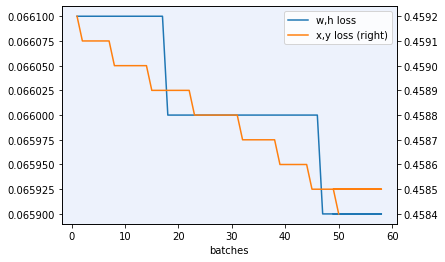

In [24]:
import matplotlib.pyplot as plt # Import the relevant module

fig, ax = plt.subplots() # Create the figure and axes object
#ax.set_facecolor('xkcd:salmon')
ax.set_facecolor((0.93, 0.95, 0.99))

# Plot the first x and y axes:
df.plot(x = 'batches', y = 'w,h loss', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'batches', y = 'x,y loss', ax = ax, secondary_y = True) 

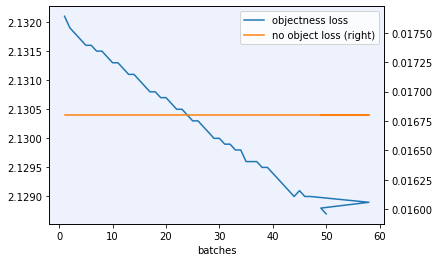

In [15]:
fig, ax = plt.subplots() # Create the figure and axes object
#ax.set_facecolor('xkcd:salmon')
ax.set_facecolor((0.93, 0.95, 0.99))

# Plot the first x and y axes:
df.plot(x = 'batches', y = 'objectness loss', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'batches', y = 'no object loss', ax = ax, secondary_y = True) 

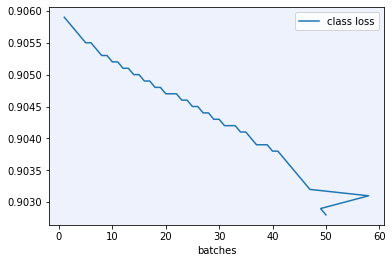

In [25]:
fig, ax = plt.subplots() # Create the figure and axes object
#ax.set_facecolor('xkcd:salmon')
ax.set_facecolor((0.93, 0.95, 0.99))

# Plot the first x and y axes:
df.plot(x = 'batches', y = 'class loss', ax = ax) 


Create a function that generates, mAP, precision, recall from the test test

In [87]:
def get_mAP(predict_boxes,target_boxes,total_boxes):
    if(predict_boxes==[]):
        return 0,0,0
    predict_boxes.sort(key=lambda x:x[0],reverse=True)
    tp=0
    fp=0
    num_diffi=0
    step=0
    dic={}
    predicted_record=[]
    
    for i in target_boxes:
        for j in i:
            if(j[4]==1):
                num_diffi+=1
    num_diffi
    
    for i in predict_boxes:        
        max_iou,diffi,index=get_max_iou(i[1:5],target_boxes[i[5]])
        if(diffi):
            continue
        if(max_iou>0.5 and [i[5],index] not in predicted_record):
            tp+=1
            predicted_record.append([i[5],index])
        else:
            fp+=1
        cur_recall=tp
        if(cur_recall not in dic.keys()):
            dic[cur_recall]=tp/(tp+fp)
    fn = total_boxes - (num_diffi + tp)
    tn = total_boxes - (tp + fp + fn)
    new={}
    for i in dic:
        new[i/(total_boxes-num_diffi)]=dic[i]
    dic=new
    if(0 in dic.keys()):
        del dic[0]
    if(dic=={}):
        return 0,0,0
    keys=list(dic.keys())
    keys.sort()
    mAP=0
    for i in range(1,len(keys)):
        mAP=mAP+(keys[i]-keys[i-1])*dic[keys[i]]
    mAP=mAP+dic[keys[0]]*keys[0]
    return mAP,tp/(total_boxes-num_diffi),tp/(tp+fp),tp, fp, fn, tn
    

Create a function  for the evaluation of our model on our test set, which generates the map,orecision, recall
as well as the drawing of the predicted bounding box on some sample test images

In [88]:
def do_test(sess,test_size=100,draw=5,verbose=False):
    difficulty=[]
    x_test=[]
    xl_test=[]
    yl_test=[]
    wl_test=[]
    hl_test=[]
    Pcl_test=[]
    Iobjl_test=[]
    pred_c_test=[]
    pred_x_test=[]
    pred_y_test=[]
    pred_w_test=[]
    pred_h_test=[]
    pred_class_test=[]
    end=False
    count=0
    while(not end):
        end,x_data,xt,yt,wt,ht,ct,objt,Inoobjl_test,diffi=data.get_test_data()
        pc,px,py,pw,ph,pclass=sess.run([allc,allx,ally,allw,allh,pred_class],\
                                                      feed_dict={input_:x_data,\
                                                      x_cor:xt,\
                                                      y_cor:yt,\
                                                      width:wt,\
                                                      height:ht,\
                                                      class_label:ct,\
                                                      Iobj:objt,\
                                                      Inoobj:Inoobjl_test,\
                                                      cur_mode:False,\
                                                      treshold:0.5
                                                     })
        difficulty+=list(diffi)
        x_test+=list(x_data)
        xl_test+=list(xt)
        yl_test+=list(yt)
        wl_test+=list(wt)
        hl_test+=list(ht)
        Pcl_test+=list(ct)
        Iobjl_test+=list(objt)
        pred_c_test+=list(pc)
        pred_x_test+=list(px)
        pred_y_test+=list(py)
        pred_w_test+=list(pw)
        pred_h_test+=list(ph)
        pred_class_test+=list(pclass)
        count+=1
        if(verbose):
            print("test batch",count,"done")
    target_boxes=[]
    total_boxes=np.sum(Iobjl_test[:test_size])
    for i in range(test_size):
        index=Iobjl_test[i]==1
        tdiffi=difficulty[i][index]
        x=xl_test[i][index]
        y=yl_test[i][index]
        w=wl_test[i][index]
        h=hl_test[i][index]
        t=[]
        for j in range(len(x)):
            ul=(x[j]-w[j]/2,y[j]-h[j]/2)
            ur=(x[j]+w[j]/2,y[j]-h[j]/2)
            dr=(x[j]+w[j]/2,y[j]+h[j]/2)
            dl=(x[j]-w[j]/2,y[j]+h[j]/2)
            t.append([ul,ur,dr,dl,tdiffi[j]])
        target_boxes.append(t)
    predict_boxes=[]
    to_draw=[]
    for i in range(test_size):
        boxes=get_surppressed_boxes(i,pred_c_test[i],pred_x_test[i],pred_y_test[i],pred_w_test[i],pred_h_test[i],pred_class_test[i])
        predict_boxes=predict_boxes+boxes
        to_draw.append(boxes)
    mAP,recall,precision, tp, fp, fn, tn=get_mAP(predict_boxes,target_boxes,total_boxes)
    print("mAP:",round(mAP,4),"recall:",round(recall,4),"precision:",round(precision,4)
         ,"TP:",tp,"FP:",fp,"FN:",fn,"TN:",tn)
    for i in range(draw):
        draw_box(x_test[i],to_draw[i])


mAP: 0.748 recall: 0.9109 precision: 0.6124 TP: 1196 FP: 757 FN: 117.0 TN: -757.0


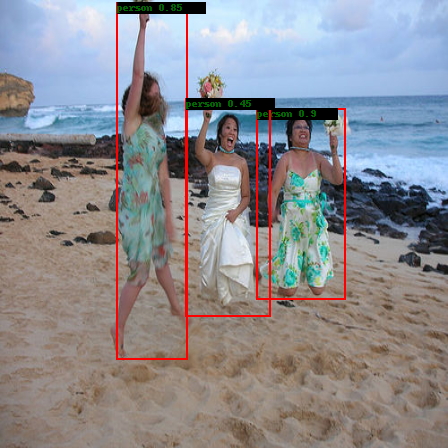

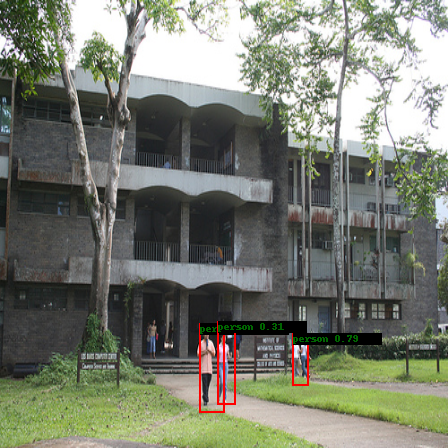

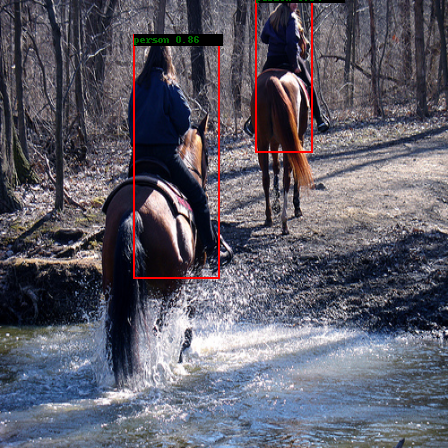

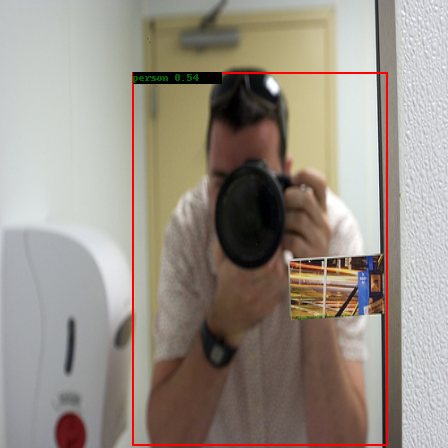

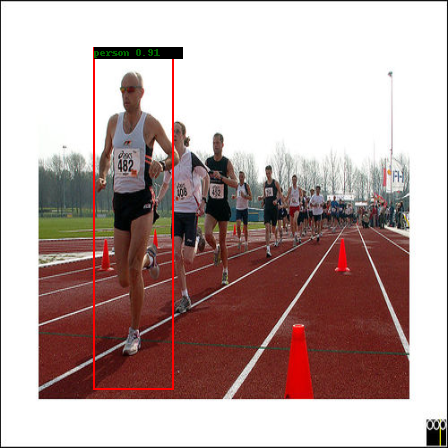

...

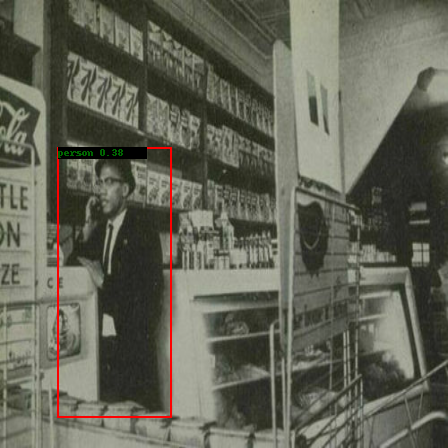

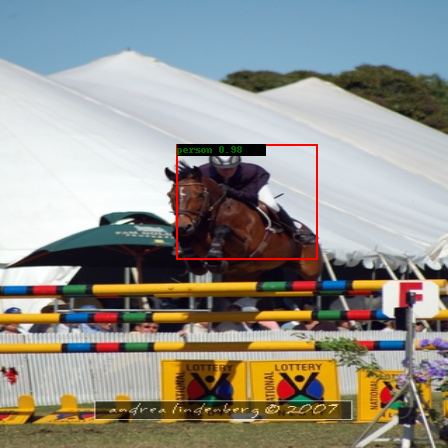

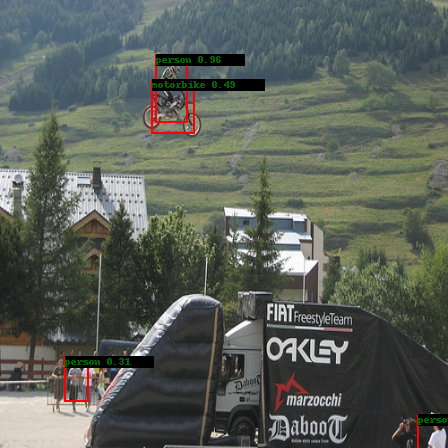

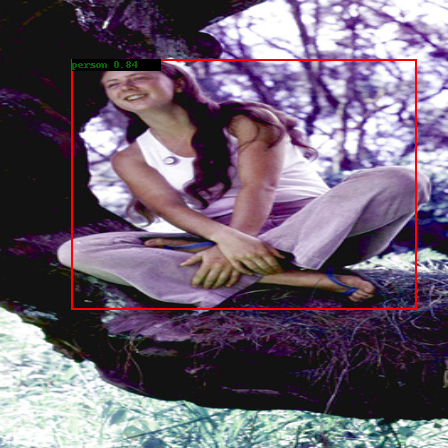

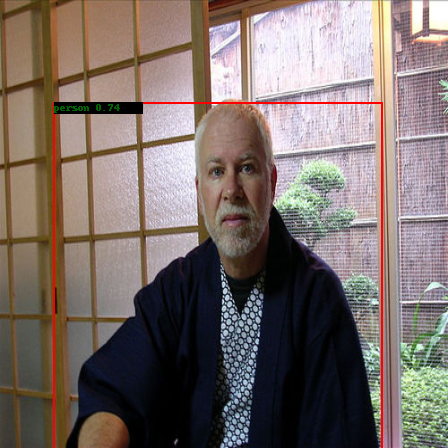

In [89]:
do_test(sess,1000,30)
